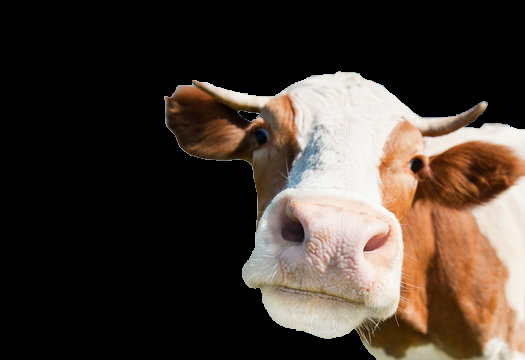

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def remove_background_grabcut(image_path):

    image = cv2.imread(image_path)
    mask = np.zeros(image.shape[:2], np.uint8)
    bg_model = np.zeros((1, 65), np.float64)
    fg_model = np.zeros((1, 65), np.float64)

    height, width = image.shape[:2]
    rect = (10, 10, width - 10, height - 10)

    cv2.grabCut(image, mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)

    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

    result = image * mask2[:, :, np.newaxis]

    return result

image_path = '/content/cowbro.jpg'
final_image = remove_background_grabcut(image_path)

cv2.imwrite('cow_no_background_grabcut.jpg', final_image)
cv2_imshow(final_image)


In [ ]:
pip install torch torchvision opencv-python tqdm matplotlib


In [ ]:
# Step 1: Install necessary dependencies
!pip install torch torchvision opencv-python tqdm matplotlib
!git clone https://github.com/ultralytics/yolov5  # Clone YOLOv5 repo
%cd yolov5
!pip install -r requirements.txt  # Install YOLOv5 requirements

import torch
import os
import shutil

# Step 2: Unzip your dataset (adjust the path if necessary)
!unzip -q /content/cattle.v2i.yolov4pytorch.zip -d /content/cattle_dataset_v2

# Step 3: Prepare data.yaml file for YOLOv5
os.makedirs('/content/cattle_dataset_v2', exist_ok=True)

data_yaml_content = '''
train: /content/cattle_dataset_v2/train
val: /content/cattle_dataset_v2/valid
nc: 1  # Number of classes (e.g., 1 for cattle)
names: ['cattle']
'''

# Write data.yaml file
with open('/content/cattle_dataset_v2/data.yaml', 'w') as f:
    f.write(data_yaml_content)

print("data.yaml file created successfully!")

# Step 4: Train the YOLOv5 model using CLI
!python train.py --img 640 --batch 16 --epochs 30 --data /content/cattle_dataset_v2/data.yaml --weights yolov5s.pt --cache

# Step 5: Load the trained model for inference (after training)
trained_model_path = '/content/yolov5/runs/train/exp/weights/best.pt'

# Function to detect and draw bounding boxes on a new image
import cv2

def detect_and_draw_bounding_boxes(image_path, model_path):
    # Load the YOLOv5 model with custom weights
    model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_path)

    # Perform detection
    results = model(image_path)

    # Load the image
    img = cv2.imread(image_path)

    # Extract bounding box results and draw them
    for *xyxy, conf, cls in results.xyxy[0].cpu().numpy():
        x1, y1, x2, y2 = map(int, xyxy)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        label = f'{model.names[int(cls)]}: {conf:.2f}'
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Display the image with bounding boxes
    cv2.imshow("Detection", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Test the model on a new image (update with your image path)
new_image_path = '/content/cattle_dataset_v2/test/00000039_jpg.rf.13352ee970d83d808cf0aa52f17dd1a6.jpg'
detect_and_draw_bounding_boxes(new_image_path, trained_model_path)


Cloning into 'yolov5'...
remote: Enumerating objects: 16965, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (111/111), done.
remote: Total 16965 (delta 81), reused 98 (delta 49), pack-reused 16805 (from 1)
Receiving objects: 100% (16965/16965), 15.70 MiB | 23.93 MiB/s, done.
Resolving deltas: 100% (11610/11610), done.
/content/yolov5/yolov5/yolov5/yolov5
data.yaml file created successfully!
2024-10-03 17:57:05.618319: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-03 17:57:05.982746: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-03 17:57:06.089505: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to re

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-10-3 Python-3.10.12 torch-2.4.1+cu121 CPU



Exception: [Errno 2] No such file or directory: '/content/yolov5/runs/train/exp/weights/best.pt'. Cache may be out of date, try `force_reload=True` or see https://docs.ultralytics.com/yolov5/tutorials/pytorch_hub_model_loading for help.

loading Roboflow workspace...
loading Roboflow project...


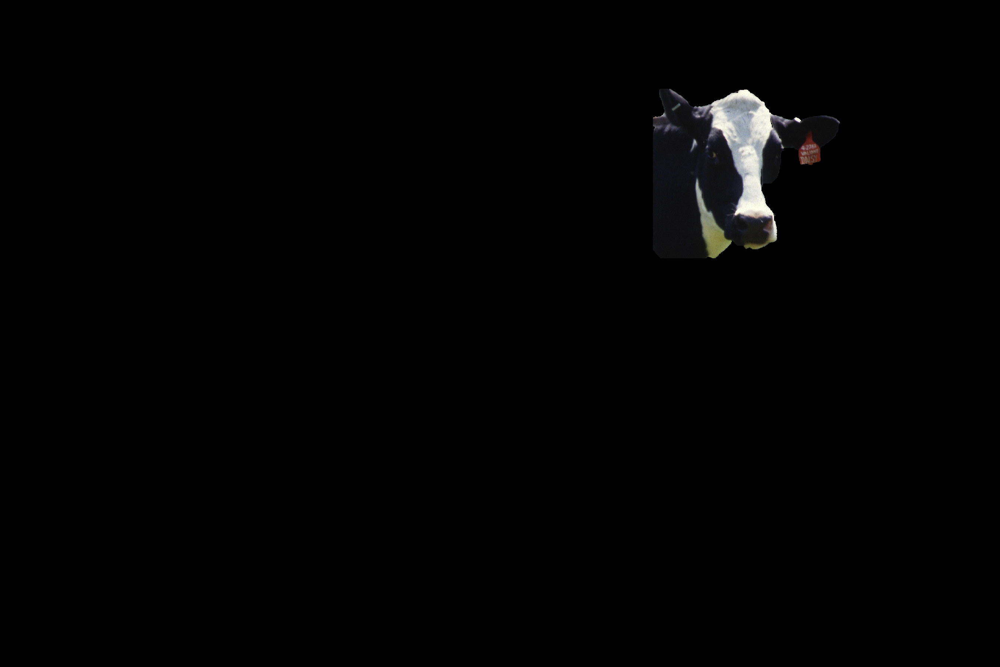

In [ ]:
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from roboflow import Roboflow
import supervision as sv

os.environ['ROBOFLOW_API_KEY'] = "lxaj6WCJFdoncZnTLq3g"

def remove_background_grabcut(image, bounding_box):
    mask = np.zeros(image.shape[:2], np.uint8)

    bg_model = np.zeros((1, 65), np.float64)
    fg_model = np.zeros((1, 65), np.float64)

    x0, y0, x1, y1 = bounding_box
    rect = (x0, y0, x1 - x0, y1 - y0)

    cv2.grabCut(image, mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)

    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    result = image * mask2[:, :, np.newaxis]

    return result

rf = Roboflow(api_key=os.environ['ROBOFLOW_API_KEY'])
project = rf.workspace().project("cattle-rhuuh")
model = project.version(3).model

image_file = "/content/Cow_female_black_white.jpg"
image = cv2.imread(image_file)

results = model.predict(image_file).json()
detections_data = results['predictions']

bounding_box = None

for detection in detections_data:
    if bounding_box is None:  # Only take the first detection
        x0 = detection['x'] - detection['width'] / 2  # Convert center x to x0 (top-left x)
        y0 = detection['y'] - detection['height'] / 2  # Convert center y to y0 (top-left y)
        x1 = detection['x'] + detection['width'] / 2  # Convert center x to x1 (bottom-right x)
        y1 = detection['y'] + detection['height'] / 2  # Convert center y to y1 (bottom-right y)

        bounding_box = (int(x0), int(y0), int(x1), int(y1))

if bounding_box:
    final_image = remove_background_grabcut(image, bounding_box)

    output_path = 'cow_no_background_grabcut.jpg'
    cv2.imwrite(output_path, final_image)
    cv2_imshow(final_image)
else:
    print("No bounding box detected.")


loading Roboflow workspace...
loading Roboflow project...


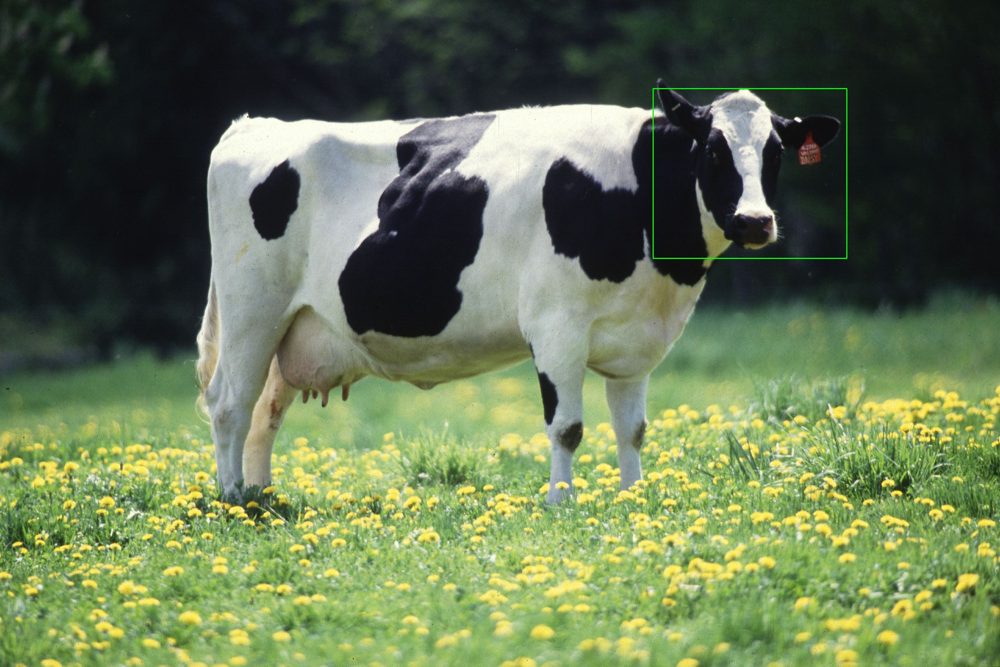

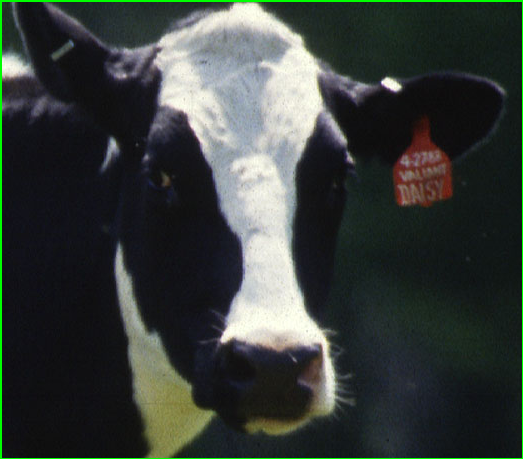

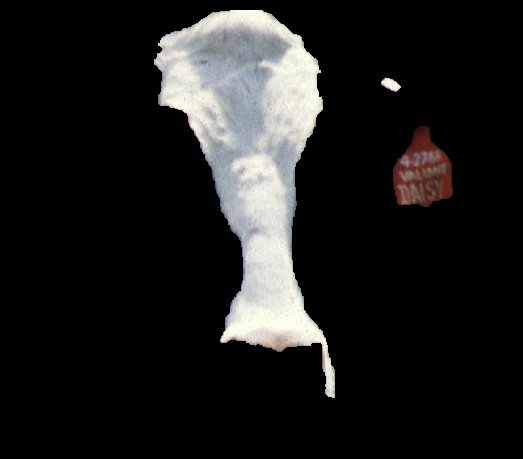

In [ ]:
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from roboflow import Roboflow

os.environ['ROBOFLOW_API_KEY'] = "lxaj6WCJFdoncZnTLq3g"

def remove_background_grabcut(image):
    if image is None or image.size == 0:
        raise ValueError("Input image is empty or invalid.")

    mask = np.zeros(image.shape[:2], np.uint8)
    bg_model = np.zeros((1, 65), np.float64)
    fg_model = np.zeros((1, 65), np.float64)
    height, width = image.shape[:2]
    rect = (10, 10, width - 20, height - 20)  # Leave a small margin for GrabCut to work

    cv2.grabCut(image, mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)

    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

    result = image * mask2[:, :, np.newaxis]

    return result

rf = Roboflow(api_key=os.environ['ROBOFLOW_API_KEY'])
project = rf.workspace().project("cattle-rhuuh")
model = project.version(3).model
# Load image from file
image_file = "/content/Cow_female_black_white.jpg"  # Replace with your image path
image = cv2.imread(image_file)

# Run inference on the image
results = model.predict(image_file).json()  # Use image file path for Roboflow inference

# Extract detections from the Roboflow results
detections_data = results['predictions']

# Prepare lists for the bounding boxes
bounding_boxes = []

# Loop through the results and collect bounding boxes
for detection in detections_data:
    x0 = int(detection['x'] - detection['width'] / 2)  # Convert center x to x0 (top-left x)
    y0 = int(detection['y'] - detection['height'] / 2)  # Convert center y to y0 (top-left y)
    x1 = int(detection['x'] + detection['width'] / 2)  # Convert center x to x1 (bottom-right x)
    y1 = int(detection['y'] + detection['height'] / 2)  # Convert center y to y1 (bottom-right y)

    bounding_boxes.append((x0, y0, x1, y1))

# Print the bounding boxes on the original image and extract the first one
for bbox in bounding_boxes:
    # Draw the bounding box on the original image
    cv2.rectangle(image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)  # Green box

# Display the image with the bounding box
cv2_imshow(image)

# Extract the first bounding box (you can modify this as needed)
if bounding_boxes:
    first_bbox = bounding_boxes[0]
    x0, y0, x1, y1 = first_bbox

    # Crop the image using the bounding box
    cropped_image = image[y0:y1, x0:x1]

    # Display the cropped image
    cv2_imshow(cropped_image)
    cv2.imwrite('cropped_image.jpg', cropped_image)

    # Check if the cropped image is valid (not empty and large enough)
    if cropped_image.size > 0 and cropped_image.shape[0] > 10 and cropped_image.shape[1] > 10:
        # Initialize a mask for the cropped image
        cropped_mask = np.zeros(cropped_image.shape[:2], np.uint8)

        # Define background and foreground models
        cropped_bg_model = np.zeros((1, 65), np.float64)
        cropped_fg_model = np.zeros((1, 65), np.float64)

        # Define a rectangle around the cropped object, leave a small margin for processing
        cropped_height, cropped_width = cropped_image.shape[:2]
        cropped_rect = (10, 10, cropped_width - 20, cropped_height - 20)

        # Apply GrabCut algorithm to the cropped image
        try:
            cv2.grabCut(cropped_image, cropped_mask, cropped_rect, cropped_bg_model, cropped_fg_model, 5, cv2.GC_INIT_WITH_RECT)

            # Modify the mask such that 0 and 2 pixels are background, and 1 and 3 are foreground
            cropped_mask2 = np.where((cropped_mask == 2) | (cropped_mask == 0), 0, 1).astype('uint8')

            # Apply the mask to the cropped image to remove the background
            final_image = cropped_image * cropped_mask2[:, :, np.newaxis]

            # Save or display the final result
            output_path = 'cow_no_background_grabcut.jpg'
            cv2.imwrite(output_path, final_image)
            cv2_imshow(final_image)  # Use cv2_imshow for Colab
        except Exception as e:
            print(f"Error applying GrabCut: {e}")
    else:
        print("Cropped image is too small or empty. Cannot perform background removal.")
else:
    print("No bounding boxes detected.")


loading Roboflow workspace...
loading Roboflow project...


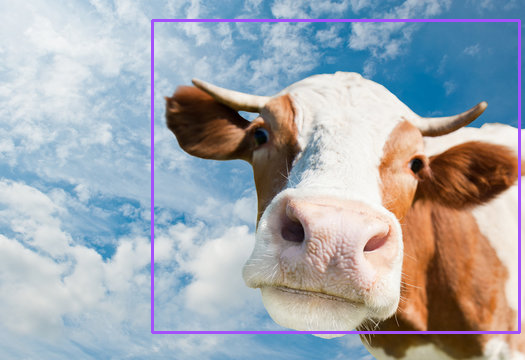

-1

In [ ]:
import os
import cv2
import numpy as np
import supervision as sv
from roboflow import Roboflow
from google.colab.patches import cv2_imshow  # Import cv2_imshow for Colab

# Set your Roboflow API Key as an environment variable
os.environ['ROBOFLOW_API_KEY'] = "lxaj6WCJFdoncZnTLq3g"

# Load image from file
image_file = "/content/cowbro.jpg"
image = cv2.imread(image_file)

# Initialize Roboflow
rf = Roboflow(api_key=os.environ['ROBOFLOW_API_KEY'])
project = rf.workspace().project("cattle-rhuuh")  # Correct project name here
model = project.version(3).model  # Specify version correctly

# Run inference on the image
results = model.predict(image_file).json()  # Use image file path for Roboflow inference

# Extract detections from the Roboflow results
detections_data = results['predictions']

# Prepare lists for the bounding boxes, confidence scores, and dummy class ids
xyxy = []
confidence = []
class_ids = []  # Add this for consistency, even if it's a single class

# Loop through the results and collect the necessary information
for detection in detections_data:
    x0 = detection['x'] - detection['width'] / 2  # Convert center x to x0 (top-left x)
    y0 = detection['y'] - detection['height'] / 2  # Convert center y to y0 (top-left y)
    x1 = detection['x'] + detection['width'] / 2  # Convert center x to x1 (bottom-right x)
    y1 = detection['y'] + detection['height'] / 2  # Convert center y to y1 (bottom-right y)

    xyxy.append([x0, y0, x1, y1])
    confidence.append(detection['confidence'])
    class_ids.append(0)  # Assign a dummy class id for a single class

# Convert lists to NumPy arrays
xyxy = np.array(xyxy)
confidence = np.array(confidence)
class_ids = np.array(class_ids)  # Convert dummy class ids to NumPy array

# Create supervision Detections object
detections = sv.Detections(
    xyxy=xyxy,
    confidence=confidence,
    class_id=class_ids  # Include class_id even if it's dummy
)

# Create supervision annotators
bounding_box_annotator = sv.BoxAnnotator()

# Annotate the image with bounding boxes
annotated_image = bounding_box_annotator.annotate(scene=image, detections=detections)

# Display the image (or save it)
cv2_imshow(annotated_image)  # Use cv2_imshow for Colab
cv2.waitKey(0)  # This line can be removed in Colab


In [ ]:
pip install roboflow opencv-python supervision


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.5 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive
